In [1]:
%%capture
!pip install torcheval-nightly

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.utils.data as data
from torch.utils.tensorboard import SummaryWriter
import torchvision.utils as vutils
import torchvision.transforms as transforms
from torcheval import metrics

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from IPython.display import clear_output
from collections import namedtuple, deque
from itertools import islice

import gc
import os
import time
import random
from google.colab import drive


In [19]:
IMAGE_SIZE = 256
BUFFER_SIZE = 50
BATCH_SIZE = 1

EPOCHs = 40
CURRENT_EPOCH = 1

TRANSFORMER_BLOCKS = 6
DISCRIMINATOR_LOSS_WEIGHT = 0.5
LAMBDA = 10
SOFT_FAKE_LABEL = [0.0, 0.3]
SOFT_REAL_LABEL = [0.7, 1.2]
REPLAY_PROB = 0.5
LR = 0.0002
LR_DECAY_EPOCH = 30

drive.mount('/content/gdrive', force_remount=True)
DATASET_PATH = '/content/gdrive/MyDrive/face2drawing/dataset'
CHECKPOINTS_PATH = '/content/gdrive/MyDrive/face2drawing/checkpoints'
LOG_PATH = '/content/gdrive/MyDrive/face2drawing/logs'

Mounted at /content/gdrive


In [37]:
class BaseModel(nn.Module):
    def __init__(self):
        super(BaseModel, self).__init__()
        self.model = None
    def forward(self, x):
        pass

class ConvolutionBlock(nn.Module):
    def __init__(self, in_channels, filters, kernel_size=7, strides=1, padding=0, activation=nn.ReLU):
        super(ConvolutionBlock, self).__init__()
        self.blocks = nn.Sequential(
                                        nn.Conv2d(in_channels, out_channels=filters, kernel_size=kernel_size, stride=strides, padding=padding),
                                        nn.InstanceNorm2d(num_features=filters),
                                        activation(inplace=True))

    def forward(self, input_tensor):
        x = self.blocks(input_tensor)
        return x

class TransposedConvolutionBlock(nn.Module):
    def __init__(self, in_channels, filters, kernel_size=7, strides=1, padding=0, output_padding=1, activation=nn.ReLU):
        super(TransposedConvolutionBlock, self).__init__()
        self.blocks = nn.Sequential(
                                    nn.ConvTranspose2d(in_channels, out_channels=filters, kernel_size=kernel_size,
                                                       stride=strides, padding=padding, output_padding=output_padding),
                                    nn.InstanceNorm2d(num_features=filters),
                                    activation(inplace=True))

    def forward(self, input_tensor):
        x = self.blocks(input_tensor)
        return x

class ResidualBlock(nn.Module):
    def __init__(self, in_channels, filters, kernel_size=3, strides=1, padding=0, activation=nn.ReLU):
        super(ResidualBlock, self).__init__()
        self.conv_blocks = nn.Sequential(
                                            nn.Conv2d(in_channels, out_channels=filters, kernel_size=kernel_size, stride=strides, padding=padding),
                                            nn.ReflectionPad2d(1),
                                            nn.InstanceNorm2d(num_features=filters),
                                            activation(inplace=True),
                                            nn.Conv2d(in_channels, out_channels=filters, kernel_size=kernel_size, stride=strides, padding=padding),
                                            nn.ReflectionPad2d(1),
                                            nn.InstanceNorm2d(num_features=filters))

    def forward(self, input_tensor):
        x = self.conv_blocks(input_tensor)
        x = x + input_tensor
        return x

def weights_init(m):
    classname = m.__class__.__name__
    if hasattr(m, 'weight') and (classname.find('Conv') != -1 or classname.find('Linear') != -1):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [46]:
def soft_real_tensor(size):
  return torch.FloatTensor(size).uniform_(SOFT_REAL_LABEL[0], SOFT_REAL_LABEL[1]).to(device)

def soft_fake_tensor(size):
  return torch.FloatTensor(size).uniform_(SOFT_FAKE_LABEL[0], SOFT_FAKE_LABEL[1]).to(device)

In [49]:
def generator_loss(generated_image):
    loss =(generated_image - soft_real_tensor(generated_image.size())).pow(2).mean()
    return loss

def cycle_consistency_loss(real_image, cycled_image):
    loss = (real_image - cycled_image).abs().mean()
    return loss * LAMBDA

def identity_loss(real_image, generated_image):
    loss = (real_image - generated_image).abs().mean()
    return loss * 0.5 * LAMBDA

class Generator(BaseModel):
    def __init__(self, input_channel=3, output_channel=3, filters=64, n_blocks=9):
        super(Generator, self).__init__()
        layers = [
                      nn.ReflectionPad2d(3),
                      ConvolutionBlock(in_channels=input_channel, filters=filters, kernel_size=7, strides=1, activation=nn.LeakyReLU),
                      ConvolutionBlock(in_channels=filters, filters=filters * 2, kernel_size=3, strides=2, padding=1, activation=nn.LeakyReLU),
                      ConvolutionBlock(in_channels=filters * 2, filters=filters * 4, kernel_size=3, strides=2, padding=1, activation=nn.LeakyReLU)
        ]

        for i in range(n_blocks):
            layers.append(ResidualBlock(in_channels=filters * 4, filters=filters * 4, kernel_size=3, strides=1, activation=nn.LeakyReLU))

        layers += [
                        TransposedConvolutionBlock(in_channels=filters * 4, filters=filters * 2, kernel_size=3, strides=2, padding=1, output_padding=1, activation=nn.LeakyReLU),
                        TransposedConvolutionBlock(in_channels=filters * 2, filters=filters, kernel_size=3, strides=2, padding=1, output_padding=1, activation=nn.LeakyReLU),
                        nn.ReflectionPad2d(3),
                        nn.Conv2d(in_channels=filters, out_channels=output_channel, kernel_size=7, stride=1, padding=0),
                        nn.Tanh()
        ]

        self.model = nn.Sequential(*layers)

    def forward(self, input_tensor):
        x = self.model(input_tensor)
        return x


In [50]:
def discriminator_loss(real_image, generated_image):
    real_loss = (real_image - soft_real_tensor(real_image.size())).pow(2).mean()
    fake_loss = (generated_image - soft_fake_tensor(generated_image.size())).pow(2).mean()
    total_loss = real_loss + fake_loss
    return total_loss * 0.5

class PatchGAN(BaseModel):
    def __init__(self, input_channel, filters=64):
        super(PatchGAN, self).__init__()

        self.model = nn.Sequential(nn.Conv2d(in_channels=input_channel, out_channels=filters, kernel_size=4, stride=2, padding=1),
                      nn.LeakyReLU(inplace=True),
                      ConvolutionBlock(in_channels=filters, filters=filters * 2, kernel_size=4, strides=2, padding=1, activation=nn.LeakyReLU),
                      ConvolutionBlock(in_channels=filters * 2, filters=filters * 4, kernel_size=4, strides=2, padding=1, activation=nn.LeakyReLU),
                      ConvolutionBlock(in_channels=filters * 4, filters=filters * 8, kernel_size=4, strides=1, padding=1, activation=nn.LeakyReLU),
                      nn.Conv2d(in_channels=filters * 8, out_channels=1, kernel_size=4, stride=1, padding=1))

    def forward(self, input_tensor):
        x = self.model(input_tensor)
        return x

In [34]:
def denormalize(images, std=0.5, mean=0.5):
    images = (images * std) + mean
    return images

def deprocess(input_tensor):
    if len(input_tensor.shape) == 3:
        return np.transpose(denormalize(input_tensor.to(device).cpu()), (1,2,0))
    elif len(input_tensor.shape) == 4:
        return np.transpose(denormalize(input_tensor.to(device).cpu()), (0, 2,3,1))

class ImagesBuffer:
    def __init__(self, buffer_size):
        self.memory = deque(maxlen=buffer_size)
        self.images = namedtuple("Images", field_names=['real_image_X', 'fake_image_X',
                                                        'real_image_Y', 'fake_image_Y'])

    def add(self, real_image_X, fake_image_X, real_image_Y, fake_image_Y):
        image_pair = self.images(real_image_X, fake_image_X.clone(), real_image_Y, fake_image_Y.clone())
        self.memory.append(image_pair)

    def sample(self):
        return self.memory.popleft()

    def __len__(self):
        return len(self.memory)


class ImagesDataset(data.Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.filenames = os.listdir(root_dir)
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = self.filenames[idx]
        img_path = os.path.join(self.root_dir, img_name)
        sample = Image.open(img_path).convert('RGB')
        if self.transform:
            sample = self.transform(sample)

        return sample


train_transfors = transforms.Compose([
                               transforms.CenterCrop(IMAGE_SIZE),
                               transforms.RandomHorizontalFlip(p=0.5),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

test_transfors = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

def process_image(model, test_input, img_name='img', step=0):
    prediction = model(test_input.to(device)).cpu().detach()
    plt.figure(figsize=(12, 12))

    display_list = [test_input, prediction]
    title = ['x', 'G(x)']

    for i in range(2):
        plt.subplot(1, 2, i+1)
        plt.title(title[i])
        plt.imshow(deprocess(display_list[i])[0])
        plt.axis('off')
    plt.show()

def process_image_cycle(model1, model2, test_input, img_name='img', step=0):
    with torch.no_grad():
        prediction1 = model1(test_input.to(device))
        prediction2 = model2(prediction1)

    test_input = test_input.cpu()
    prediction1 = prediction1.cpu()
    prediction2 = prediction2.cpu()
    display_list = [test_input, prediction1, prediction2]
    title = ['x', 'G(x)', 'F(G(x))']


    plt.figure(figsize=(12, 12))
    for i in range(3):
       plt.subplot(1, 3, i+1)
       plt.title(title[i])
       plt.imshow(deprocess(display_list[i])[0])
       plt.axis('off')
    plt.show()

In [25]:
train_data_X = ImagesDataset(root_dir=os.path.join(DATASET_PATH, "trainA"),
                           transform=train_transfors)

train_data_Y = ImagesDataset(root_dir=os.path.join(DATASET_PATH, "trainB"),
                           transform=train_transfors)

test_data_X = ImagesDataset(root_dir=os.path.join(DATASET_PATH, "testA"),
                           transform=test_transfors)

test_data_Y = ImagesDataset(root_dir=os.path.join(DATASET_PATH, "testB"),
                           transform=test_transfors)


train_image_loader_X = torch.utils.data.DataLoader(train_data_X, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=0)
train_image_loader_Y = torch.utils.data.DataLoader(train_data_Y, batch_size=BATCH_SIZE,
                                         shuffle=True, num_workers=0)
test_image_loader_X = torch.utils.data.DataLoader(test_data_X, batch_size=BATCH_SIZE,
                                         shuffle=False, num_workers=0)
test_image_loader_Y = torch.utils.data.DataLoader(test_data_Y, batch_size=BATCH_SIZE,
                                         shuffle=False, num_workers=0)

print("{}:{}".format('trainA',len(train_data_X), ))
print("{}:{}".format('trainB', len(train_data_Y)))
print("{}:{}".format('testA', len(test_data_X)))
print("{}:{}".format('testB',len(test_data_Y)))

iter_train_image_X = iter(train_image_loader_X)
iter_train_image_Y = iter(train_image_loader_Y)
iter_test_image_X = iter(test_image_loader_X)
iter_test_image_Y = iter(test_image_loader_Y)

sample_X = next(iter_test_image_X)
sample_Y = next(iter_test_image_Y)

image_buffer = ImagesBuffer(buffer_size=BUFFER_SIZE)

trainA:1194
trainB:1198
testA:5
testB:4


In [26]:
training_steps = min(len(train_data_X), len(train_data_Y))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
writer = SummaryWriter(LOG_PATH)

G_XtoY = Generator(input_channel=3, output_channel=3, filters=64, n_blocks=TRANSFORMER_BLOCKS).to(device)
G_YtoX = Generator(input_channel=3, output_channel=3, filters=64, n_blocks=TRANSFORMER_BLOCKS).to(device)
G_XtoY.apply(weights_init)
G_YtoX.apply(weights_init)
G_XtoY_optimizer = optim.Adam(G_XtoY.parameters(), lr=0.0002, betas=(0.5, 0.999))
G_YtoX_optimizer = optim.Adam(G_YtoX.parameters(), lr=0.0002, betas=(0.5, 0.999))

Dx = PatchGAN(input_channel=3, filters=64).to(device)
Dy = PatchGAN(input_channel=3, filters=64).to(device)
Dx.apply(weights_init)
Dy.apply(weights_init)
Dx_optimizer = optim.Adam(Dx.parameters(), lr=0.0002, betas=(0.5, 0.999))
Dy_optimizer = optim.Adam(Dy.parameters(), lr=0.0002, betas=(0.5, 0.999))


def lambda_rule(epoch):
    lr = 1.0 - max(0, epoch + 1 - LR_DECAY_EPOCH) / float(LR_DECAY_EPOCH + 1)
    return lr

Dx_optimizer_scheduler = lr_scheduler.LambdaLR(Dx_optimizer, lr_lambda=lambda_rule)
Dy_optimizer_scheduler = lr_scheduler.LambdaLR(Dy_optimizer, lr_lambda=lambda_rule)
G_XtoY_optimizer_scheduler = lr_scheduler.LambdaLR(G_XtoY_optimizer, lr_lambda=lambda_rule)
G_YtoX_optimizer_scheduler = lr_scheduler.LambdaLR(G_YtoX_optimizer, lr_lambda=lambda_rule)

In [27]:
def save_training_checkpoint(epoch):
    state_dict = {
    'G_XtoY':G_XtoY.state_dict(),
    'G_YtoX':G_YtoX.state_dict(),
    'Dx':Dx.state_dict(),
    'Dy':Dy.state_dict(),
    'G_XtoY_optimizer':G_XtoY_optimizer.state_dict(),
    'G_YtoX_optimizer':G_YtoX_optimizer.state_dict(),
    'Dx_optimizer':Dx_optimizer.state_dict(),
    'Dy_optimizer':Dy_optimizer.state_dict(),
    'Dx_optimizer_scheduler': Dx_optimizer_scheduler.state_dict(),
    'Dy_optimizer_scheduler': Dy_optimizer_scheduler.state_dict(),
    'G_XtoY_optimizer_scheduler': G_XtoY_optimizer_scheduler.state_dict(),
    'G_YtoX_optimizer_scheduler': G_YtoX_optimizer_scheduler.state_dict(),
    'epoch': epoch
    }

    save_path = os.path.join(CHECKPOINTS_PATH, 'training-checkpoint')
    torch.save(state_dict, save_path)


if os.path.isfile(os.path.join(CHECKPOINTS_PATH, 'training-checkpoint')):
    checkpoint = torch.load(os.path.join(CHECKPOINTS_PATH, 'training-checkpoint'))
    G_XtoY.load_state_dict(checkpoint['G_XtoY'])
    G_YtoX.load_state_dict(checkpoint['G_YtoX'])
    Dx.load_state_dict(checkpoint['Dx'])
    Dy.load_state_dict(checkpoint['Dy'])
    G_XtoY_optimizer.load_state_dict(checkpoint['G_XtoY_optimizer'])
    G_YtoX_optimizer.load_state_dict(checkpoint['G_YtoX_optimizer'])
    Dx_optimizer.load_state_dict(checkpoint['Dx_optimizer'])
    Dy_optimizer.load_state_dict(checkpoint['Dy_optimizer'])
    Dx_optimizer_scheduler.load_state_dict(checkpoint['Dx_optimizer_scheduler'])
    Dy_optimizer_scheduler.load_state_dict(checkpoint['Dy_optimizer_scheduler'])
    G_XtoY_optimizer_scheduler.load_state_dict(checkpoint['G_XtoY_optimizer_scheduler'])
    G_YtoX_optimizer_scheduler.load_state_dict(checkpoint['G_YtoX_optimizer_scheduler'])
    CURRENT_EPOCH = checkpoint['epoch']
    print ('Checkpoint: {}'.format(CURRENT_EPOCH))

Checkpoint: 40


In [28]:
writer.add_graph(G_XtoY, sample_X.to(device))
writer.add_graph(G_YtoX, sample_Y.to(device))
writer.add_graph(Dx, sample_X.to(device))
writer.add_graph(Dy, sample_Y.to(device))
writer.flush()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/dataset/logs

Output hidden; open in https://colab.research.google.com to view.

In [51]:
for epoch in range(CURRENT_EPOCH, EPOCHs + 1):
    print('Epoch: {}'.format(epoch))
    start = time.time()
    iter_train_image_X = iter(train_image_loader_X)
    iter_train_image_Y = iter(train_image_loader_Y)
    G_XtoY_loss_mean = 0
    G_YtoX_loss_mean = 0
    Dx_loss_mean = 0
    Dy_loss_mean = 0
    large_step = 0
    for step in range(training_steps):
        replay_previous = True if REPLAY_PROB > random.random() else False

        real_image_X = next(iter_train_image_X).to(device)
        real_image_Y = next(iter_train_image_Y).to(device)

        fake_image_X = G_YtoX(real_image_Y).detach()
        fake_image_Y = G_XtoY(real_image_X).detach()

        image_buffer.add(real_image_X, fake_image_X, real_image_Y, fake_image_Y)

        Dx_optimizer.zero_grad()
        Dy_optimizer.zero_grad()
        if replay_previous:
            buffered_images = image_buffer.sample()
            real_buffer_image_X = buffered_images.real_image_X
            fake_buffer_image_X = buffered_images.fake_image_X
            real_buffer_image_Y = buffered_images.real_image_Y
            fake_buffer_image_Y = buffered_images.fake_image_Y

            Dx_real_buffer = Dx(real_buffer_image_X)
            Dx_fake_buffer = Dx(fake_buffer_image_X)
            Dx_loss = discriminator_loss(Dx_real_buffer, Dx_fake_buffer)

            Dy_real_buffer = Dy(real_buffer_image_Y)
            Dy_fake_buffer = Dy(fake_buffer_image_Y)
            Dy_loss = discriminator_loss(Dy_real_buffer, Dy_fake_buffer)
        else:
            Dx_real = Dx(real_image_X)
            Dx_fake = Dx(fake_image_X)
            Dy_real = Dy(real_image_Y)
            Dy_fake = Dy(fake_image_Y)
            Dx_loss = discriminator_loss(Dx_real, Dx_fake)
            Dy_loss = discriminator_loss(Dy_real, Dy_fake)

        Dx_loss.backward()
        Dy_loss.backward()
        Dx_optimizer.step()
        Dy_optimizer.step()

        G_XtoY_optimizer.zero_grad()
        G_YtoX_optimizer.zero_grad()

        fake_image_Y = G_XtoY(real_image_X)
        fake_image_X = G_YtoX(real_image_Y)
        dis_fake_image_Y = Dy(fake_image_Y)
        dis_fake_image_X = Dx(fake_image_X)

        G_XtoY_loss = generator_loss(dis_fake_image_Y)
        G_YtoX_loss = generator_loss(dis_fake_image_X)

        cycled_XtoYtoX = G_YtoX(fake_image_Y)
        cycled_YtoXtoY = G_XtoY(fake_image_X)
        cycled_XtoY_loss = cycle_consistency_loss(real_image_X, cycled_XtoYtoX)
        cycled_YtoX_loss = cycle_consistency_loss(real_image_Y, cycled_YtoXtoY)
        total_cycle_loss = cycled_XtoY_loss + cycled_YtoX_loss

        same_image_Y = G_XtoY(real_image_Y)
        same_image_X = G_YtoX(real_image_X)
        identity_loss_for_YtoX = identity_loss(real_image_X, same_image_X)
        identity_loss_for_XtoY = identity_loss(real_image_Y, same_image_Y)

        total_G_XtoY_loss = G_XtoY_loss + identity_loss_for_XtoY
        total_G_YtoX_loss = G_YtoX_loss + identity_loss_for_YtoX
        total_G_losses = total_G_XtoY_loss + total_G_YtoX_loss + total_cycle_loss

        total_G_losses.backward()
        G_XtoY_optimizer.step()
        G_YtoX_optimizer.step()

        G_XtoY_loss_mean = G_XtoY_loss_mean + total_G_XtoY_loss.item() + total_cycle_loss.item()
        G_YtoX_loss_mean = G_YtoX_loss_mean + total_G_YtoX_loss.item() + total_cycle_loss.item()
        Dx_loss_mean += Dx_loss.item()
        Dy_loss_mean += Dy_loss.item()

        if step % 10 == 0:
            large_step += 1
            print ('[{}]'.format(large_step), end='')

    writer.add_scalar('Loss/total_G_XtoY_loss', G_XtoY_loss_mean / training_steps, epoch)
    writer.add_scalar('Loss/total_G_YtoX_loss', G_YtoX_loss_mean / training_steps, epoch)
    writer.add_scalar('Loss/Dx_loss', Dx_loss_mean / training_steps, epoch)
    writer.add_scalar('Loss/Dy_loss', Dy_loss_mean / training_steps, epoch)
    writer.flush()

    Dx_optimizer_scheduler.step()
    Dy_optimizer_scheduler.step()
    G_XtoY_optimizer_scheduler.step()
    G_YtoX_optimizer_scheduler.step()

    clear_output(wait=True)
    process_image(G_XtoY, sample_X, img_name='sample_X', step=epoch)
    process_image(G_YtoX, sample_Y, img_name='sample_Y', step=epoch)


    save_training_checkpoint(epoch)

    print ('Epoch {} is finished after {} sec\n'.format(epoch,
                                                      time.time()-start))
    gc.collect()

Epoch: 40


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


[1][2][3][4][5]

KeyboardInterrupt: 

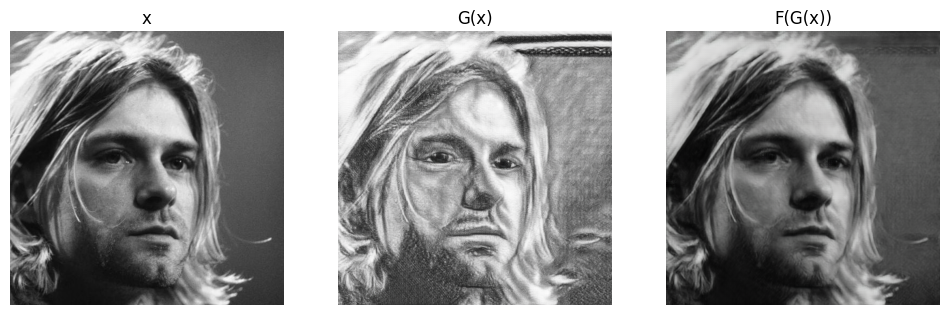

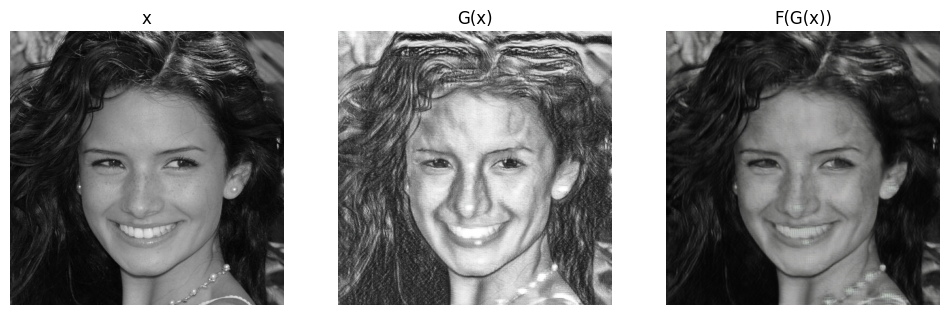

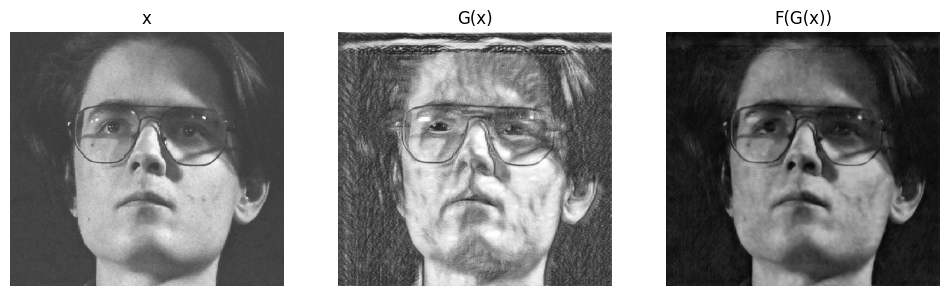

In [16]:
iter_test1 = iter(test_image_loader_X)
iter_test2 = iter(test_image_loader_X)
iter_test3 = iter(test_image_loader_X)

n = 1
test = next(islice(iter_test1, n, n+1))
process_image_cycle(G_XtoY, G_YtoX, test, img_name='test', step=41)

n = 2
test = next(islice(iter_test2, n, n+1))
process_image_cycle(G_XtoY, G_YtoX, test, img_name='test', step=41)

n = 4
test = next(islice(iter_test3, n, n+1))
process_image_cycle(G_XtoY, G_YtoX, test, img_name='test', step=41)

In [ ]:
def normalize(image):
  flattened_image = image.view(image.shape[0], -1, 1, 1)
  image_min, _ = torch.min(flattened_image, dim=1, keepdim=True)
  image_max, _ = torch.max(flattened_image, dim=1, keepdim=True)
  image = (image - image_min) / (image_max - image_min)
  return(image)


fid_score = metrics.FrechetInceptionDistance(device=device)
iter_train_image_Y = iter(train_image_loader_Y)
iter_train_image_X = iter(train_image_loader_X)
fid_score.reset()
for i in range(1000):
  real_image = normalize(next(iter_train_image_Y).to(device))
  fid_score.update(real_image, True)

  fake_image = normalize(G_XtoY(next(iter_train_image_X).to(device)))
  fid_score.update(fake_image, False)

fid_score.compute()